### Method #1. Tree-based cllassification

#### Step 1 : Collecting the data

In [2]:
import pandas as pd
input_file = "/Users/hit028/Desktop/530 Lab1/credit.csv"
credit = pd.read_csv(input_file)

#### Step 2 : Exploring the data

In [4]:
credit.describe()

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000,...,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.700000,2.577000,20.903000,2.54500,2.828000,3271.24800,2.105000,3.384000,2.973000,2.68200,...,2.845000,2.358000,35.54200,2.675000,1.928000,1.407000,2.904000,1.155000,1.404000,1.037000
std,0.458487,1.257638,12.058814,1.08312,2.744439,2822.75176,1.580023,1.208306,1.118715,0.70808,...,1.103718,1.050209,11.35267,0.705601,0.530186,0.577654,0.653614,0.362086,0.490943,0.188856
min,0.000000,1.000000,4.000000,0.00000,0.000000,250.00000,1.000000,1.000000,1.000000,1.00000,...,1.000000,1.000000,19.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,1.000000,12.000000,2.00000,1.000000,1365.50000,1.000000,3.000000,2.000000,2.00000,...,2.000000,1.000000,27.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
50%,1.000000,2.000000,18.000000,2.00000,2.000000,2319.50000,1.000000,3.000000,3.000000,3.00000,...,3.000000,2.000000,33.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
75%,1.000000,4.000000,24.000000,4.00000,3.000000,3972.25000,3.000000,5.000000,4.000000,3.00000,...,4.000000,3.000000,42.00000,3.000000,2.000000,2.000000,3.000000,1.000000,2.000000,1.000000
max,1.000000,4.000000,72.000000,4.00000,10.000000,18424.00000,5.000000,5.000000,4.000000,4.00000,...,4.000000,4.000000,75.00000,3.000000,3.000000,4.000000,4.000000,2.000000,2.000000,2.000000


In [5]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
Creditability                        1000 non-null int64
Account Balance                      1000 non-null int64
Duration of Credit (month)           1000 non-null int64
Payment Status of Previous Credit    1000 non-null int64
Purpose                              1000 non-null int64
Credit Amount                        1000 non-null int64
Value Savings/Stocks                 1000 non-null int64
Length of current employment         1000 non-null int64
Instalment per cent                  1000 non-null int64
Sex & Marital Status                 1000 non-null int64
Guarantors                           1000 non-null int64
Duration in Current address          1000 non-null int64
Most valuable available asset        1000 non-null int64
Age (years)                          1000 non-null int64
Concurrent Credits                   1000 non-null int64
Type of apartment                    10

In [6]:
target = credit['Creditability']
target.value_counts()

1    700
0    300
Name: Creditability, dtype: int64

In [7]:
import random
random.seed(12345)
indx = random.sample(range(0, 1000), 1000)
credit_rand = credit.iloc[indx]
target_rand = target.iloc[indx]

credit_rand.head(5)

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
426,1,2,39,3,6,11760,2,4,2,3,...,3,4,32,3,1,1,3,1,2,1
750,1,2,36,3,0,2862,2,5,4,3,...,3,4,30,3,3,1,3,1,1,1
10,1,1,11,4,0,3905,1,3,2,3,...,2,1,36,3,1,2,3,2,1,1
839,0,4,12,2,0,1386,3,3,2,2,...,2,2,26,3,2,1,3,1,1,1
845,0,2,27,4,3,2520,3,3,4,3,...,2,2,23,3,2,2,2,1,1,1


In [8]:
credit_rand.describe()

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000,...,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.700000,2.577000,20.903000,2.54500,2.828000,3271.24800,2.105000,3.384000,2.973000,2.68200,...,2.845000,2.358000,35.54200,2.675000,1.928000,1.407000,2.904000,1.155000,1.404000,1.037000
std,0.458487,1.257638,12.058814,1.08312,2.744439,2822.75176,1.580023,1.208306,1.118715,0.70808,...,1.103718,1.050209,11.35267,0.705601,0.530186,0.577654,0.653614,0.362086,0.490943,0.188856
min,0.000000,1.000000,4.000000,0.00000,0.000000,250.00000,1.000000,1.000000,1.000000,1.00000,...,1.000000,1.000000,19.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,1.000000,12.000000,2.00000,1.000000,1365.50000,1.000000,3.000000,2.000000,2.00000,...,2.000000,1.000000,27.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
50%,1.000000,2.000000,18.000000,2.00000,2.000000,2319.50000,1.000000,3.000000,3.000000,3.00000,...,3.000000,2.000000,33.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
75%,1.000000,4.000000,24.000000,4.00000,3.000000,3972.25000,3.000000,5.000000,4.000000,3.00000,...,4.000000,3.000000,42.00000,3.000000,2.000000,2.000000,3.000000,1.000000,2.000000,1.000000
max,1.000000,4.000000,72.000000,4.00000,10.000000,18424.00000,5.000000,5.000000,4.000000,4.00000,...,4.000000,4.000000,75.00000,3.000000,3.000000,4.000000,4.000000,2.000000,2.000000,2.000000


In [9]:
credit_train = credit_rand.iloc[0:70]
credit_test = credit_rand.iloc[700:1000]
target_train = target_rand.iloc[0:700]
target_test = target_rand.iloc[700:1000]

In [10]:
target_train.value_counts()/700

1    0.691429
0    0.308571
Name: Creditability, dtype: float64

In [11]:
target_test.value_counts()/300

1    0.72
0    0.28
Name: Creditability, dtype: float64

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
y = target
X = credit.drop(['Creditability'], axis=1)

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 52)

#### Step 3 : Training a model on the data

In [16]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [17]:
model = tree.DecisionTreeClassifier()
model = model.fit(X_train, y_train)

In [18]:
from IPython.display import SVG

In [19]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [20]:
from graphviz import Source
from IPython.display import display

In [21]:
graph = Source(tree.export_graphviz(model, out_file=None, feature_names=X.columns, class_names=['default', 'no default'], filled = True))

In [22]:
conda install graphviz

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


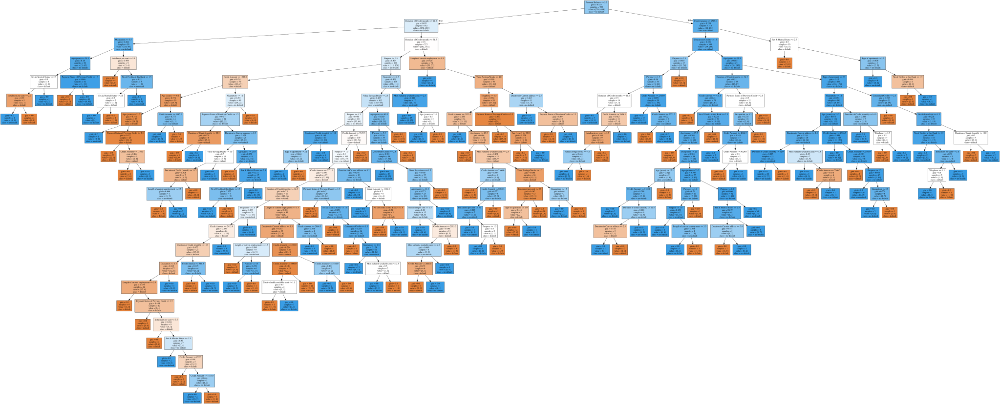

In [23]:
display(SVG(graph.pipe(format = 'svg')))

#### Step 4 : Evaluating model performance

In [25]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [26]:
y_predict = model.predict(X_test)

In [27]:
confusion_matrix(y_test, y_predict)
accuracy_score(y_test, y_predict)*100

68.33333333333333

Q1 : If you see the accuracy 0f 100%, what does it mean? Does this mean that we design a perfect model? This is some thing that needs more discussion. Write a few sentences about accuracy of 100%.

Answer : It doesn't mean that the model is perfect when the accuracy score is 100% because it's probably too good to be true and might be overfitted. In the real world it 100% accuracy doesn't sound true...

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=23458)

### Method 2 : Random Forest

In [32]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier() 
clf.fit(X_train, y_train)

/Users/hit028/opt/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [33]:
y_predict = clf.predict(X_test) 
print(confusion_matrix(y_test, y_predict))

[[ 52  30]
 [ 39 179]]


In [34]:
print(accuracy_score(y_test, y_predict)*100)

77.0


Q2 : What are the three most important features in this model?

Answer : From below, they are "purpose", "creditability", and "account balance". However, when I run this command many times, it sometimes show that the 3rd importance feature as "age".

In [37]:
import pandas as pd

In [38]:
credit.head()

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
0,1,1,18,4,2,1049,1,2,4,2,...,4,2,21,3,1,1,3,1,1,1
1,1,1,9,4,0,2799,1,3,2,3,...,2,1,36,3,1,2,3,2,1,1
2,1,2,12,2,9,841,2,4,2,2,...,4,1,23,3,1,1,2,1,1,1
3,1,1,12,4,0,2122,1,3,3,3,...,2,1,39,3,1,2,2,2,1,2
4,1,1,12,4,0,2171,1,3,4,3,...,4,2,38,1,2,2,2,1,1,2


In [39]:
cols = ["creditability", "account_balance", "duration", "payment_status", "purpose", "credit_amount", "value", "employment", "instalment", "sex", "current_address", "available_asset", "age", "credits", "apartment", "this_bank", "occupation", "dependents", "telephone", "foreign_worker"]

In [40]:
feature_importances = pd.DataFrame(clf.feature_importances_, index = cols[0:20], columns=['importance']).sort_values('importance', ascending=False) 

In [41]:
feature_importances

,importance
purpose,0.141127
age,0.113862
creditability,0.107613
account_balance,0.107119
payment_status,0.062547
duration,0.053750
value,0.049357
available_asset,0.046402
credit_amount,0.043455
employment,0.042214


### Method 3 : Adding regression to trees

#### Step 1 : Collecting the data

In [43]:
input_file2 = "/Users/hit028/Desktop/530 Lab1/whitewines.csv"

In [44]:
wine = pd.read_csv(input_file2)
wine.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.7,0.62,0.24,1.10,0.039,6.0,62.0,0.99340,3.41,0.32,10.400000,5
1,5.7,0.22,0.20,16.00,0.044,41.0,113.0,0.99862,3.22,0.46,8.900000,6
2,5.9,0.19,0.26,7.40,0.034,33.0,123.0,0.99500,3.49,0.42,10.100000,6
3,5.3,0.47,0.10,1.30,0.036,11.0,74.0,0.99082,3.48,0.54,11.200000,4
4,6.4,0.29,0.21,9.65,0.041,36.0,119.0,0.99334,2.99,0.34,10.933333,6


In [45]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
fixed acidity           4898 non-null float64
volatile acidity        4898 non-null float64
citric acid             4898 non-null float64
residual sugar          4898 non-null float64
chlorides               4898 non-null float64
free sulfur dioxide     4898 non-null float64
total sulfur dioxide    4898 non-null float64
density                 4898 non-null float64
pH                      4898 non-null float64
sulphates               4898 non-null float64
alcohol                 4898 non-null float64
quality                 4898 non-null int64
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [46]:
import matplotlib.pyplot as plt

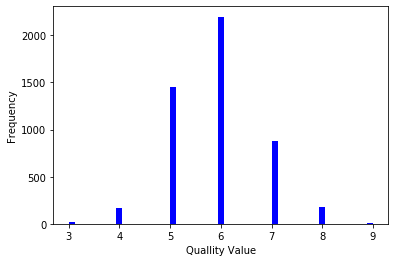

In [47]:
n, bins, patches = plt.hist(x=wine['quality'], bins='auto', color='b', )
plt.xlabel('Quallity Value')
plt.ylabel('Frequency')
plt.show()

#### Step 2 : Exploring and preparing the data

In [49]:
target2 = wine['quality']
target2.value_counts()

6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: quality, dtype: int64

In [50]:
from sklearn.model_selection import train_test_split

In [51]:
y2 = target2 
X2 = wine.drop(['quality'], axis=1)

In [52]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.25, random_state=1234)

#### Step 3 : Splitting Data and train the model

In [54]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [55]:
model2 = tree.DecisionTreeClassifier()
model2 = model2.fit(X2_train, y2_train)

In [56]:
from sklearn.tree import export_graphviz

In [57]:
export_graphviz(model2, out_file = 'tree.dot', feature_names = X2.columns)

In [58]:
from graphviz import Source 

In [59]:
dot_data2 = tree.export_graphviz(model2, out_file = None, feature_names = X2.columns, filled = True, rounded = True, special_characters = True)

In [60]:
import graphviz 
dot_data2= tree.export_graphviz(model2, out_file=None) 
graph2 = graphviz.Source(dot_data2)

In [61]:
graph2 = graphviz.Source(dot_data2)

In [62]:
graph2

#### Step 4 : Evaluating Model Performance

In [64]:
import numpy as np

In [65]:
np.corrcoef(y_test,y_predict)

array([[1.        , 0.44135563],
       [0.44135563, 1.        ]])

Q3 : What is your interpretation about this amount of RMSE?

Answer : Since it's the error value, we want it to be low as possible, therefore this RMSE value indicates this is not quite ideal...

### Method #4. News Popularity

#### Step 1 : Collecting the data

In [100]:
input_file3 = "/Users/hit028/Desktop/530 Lab1/OnlineNewsPopularityP.csv"

In [101]:
import pandas as pd
news = pd.read_csv(input_file3)
news.head(5)

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


#### Step 2 : Pre-processing

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [104]:
target3 = news['shares']

In [105]:
target3.value_counts()

1100      2308
1200      2018
1300      1740
1400      1592
1500      1323
          ... 
197600       1
310800       1
92           1
57800        1
82200        1
Name: shares, Length: 1454, dtype: int64

In [106]:
popular = news.shares >= 1400
unpopular = news.shares < 1400 
news.loc[popular,'shares'] = 1 
news.loc[unpopular,'shares'] = 0

In [107]:
import random
random.seed(12345)
indx3 = random.sample(range(0, 1000), 1000) 
news_rand = news.iloc[indx3] 
target3_rand = target3.iloc[indx3]

In [108]:
news_train = news_rand.iloc[0:700] 
news_test = news_rand.iloc[700:1000]
target3_train = target3_rand.iloc[0:700] 
target3_test = target3_rand.iloc[700:1000]

In [109]:
news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
url                              39644 non-null object
timedelta                        39644 non-null int64
n_tokens_title                   39644 non-null int64
n_tokens_content                 39644 non-null int64
n_unique_tokens                  39644 non-null float64
n_non_stop_words                 39644 non-null float64
n_non_stop_unique_tokens         39644 non-null float64
num_hrefs                        39644 non-null int64
num_self_hrefs                   39644 non-null int64
num_imgs                         39644 non-null int64
num_videos                       39644 non-null int64
average_token_length             39644 non-null float64
num_keywords                     39644 non-null int64
data_channel_is_lifestyle        39644 non-null int64
data_channel_is_entertainment    39644 non-null int64
data_channel_is_bus              39644 non-null int64
data_channel_is_so

#### Decision Tree

In [111]:
y3 = target3
X3 = news.drop(['url', 'shares'], axis=1)

In [112]:
from sklearn.model_selection import train_test_split
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size = 0.30, random_state = 2345)

In [113]:
from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier 

In [114]:
model3 = tree.DecisionTreeClassifier() 
model3 = model3.fit(X3_train, y3_train)

In [115]:
model3

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [116]:
from graphviz import Source
from IPython.display import display
from IPython.display import SVG

In [117]:
graph3 = Source(tree.export_graphviz(model3, out_file=None, feature_names=X3.columns, class_names=['default', 'no default'], filled = True))

In [118]:
display(SVG(graph3.pipe(format = 'svg')))

In [119]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score

In [120]:
y_predict3 = model3.predict(X3_test) 

print(confusion_matrix(y3_test, y_predict3)) 
print(accuracy_score(y3_test, y_predict3)*100)

[[3043 2493]
 [2540 3818]]
57.684546830334625


YES!! I got 58% back by dropping "shares" as well!! Thank you Prof.Sadeghian!
The accuracy score of Decision Tree here now says 100%, which means something is wrong. When I ran this code before, I got 58.11%.

#### Random Forest

In [93]:
from sklearn.ensemble import RandomForestClassifier 

clf3 = RandomForestClassifier()
clf3.fit(X3_train, y3_train)

/Users/hit028/opt/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [94]:
y_predict3 = clf3.predict(X3_test) 

print(confusion_matrix(y3_test, y_predict3))
print(accuracy_score(y3_test, y_predict3)*100)

[[3598 1938]
 [2534 3824]]
62.4012106944678


By dropping "shares" brought the correct accuracy score here too! It's 62%

This time I got 99.9% accuracy here but I've got the accuracy score of Random Forest as 62% before.

In [96]:
import pandas as pd 
feature_importances3 = pd.DataFrame(clf3.feature_importances_, index = X3_train.columns,
columns = ['importance']).sort_values('importance', ascending = False)

In [97]:
feature_importances3

,importance
kw_avg_avg,0.044961
kw_max_avg,0.039708
timedelta,0.032124
LDA_02,0.031305
LDA_04,0.029921
kw_avg_min,0.029107
self_reference_min_shares,0.028792
LDA_01,0.028319
kw_avg_max,0.028124
LDA_00,0.028004


From above, the 3 most important features here are "shares", "kw_max_avg:Avg.keyword(max.shares)", and "LDA_02:Closeness to LDA topic 2". But when I ran this code earlier, it gave me "kw_avg_avg:Avg.keyword(avg.shares)" as the most importance feature instead of "shares".